In [20]:
import os
import zipfile
import tensorflow as tf
import numpy as np
# from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import tensorflow.keras as keras

from glob import glob

import pandas as pd
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from keras import layers
from keras import Model, Input
from keras.applications.densenet import DenseNet201

from keras.callbacks import ReduceLROnPlateau, EarlyStopping

import torchvision.models as models
%matplotlib inline
import matplotlib.pyplot as plt

# Preprocessing

In [21]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [22]:
os.chdir('/content/drive/MyDrive/DGU_Ensemble model/Penyu_datasets_SA')

In [23]:
# Directory with our training horse pictures
train_dir = os.path.join('./train')
validation_dir = os.path.join( './validasi')
test_dir = os.path.join( './uji')

#penyu Hijau
latih_hijau = os.path.join('./train/Chelonia mydas')
#Lepidochelys olivacea
latih_lekang = os.path.join('./train/Lepidochelys olivacea')
#Penyu sisik
latih_sisik = os.path.join('./train/Eretmochelys imbricata')
#Penyu tempayan
latih_tempayan = os.path.join('./train/Caretta caretta')

#validasi Hijau
validasi_Hijau = os.path.join('./valid/Chelonia mydas')
#validasi Lekang
validasi_Lekang = os.path.join('./valid/Lepidochelys olivacea')
#validasi Sisik
validasi_Sisik = os.path.join('./valid/Eretmochelys imbricata')
#validasi Tempayan
validasi_Tempayan = os.path.join('./valid/Caretta caretta')

#uji Hijau
uji_Hijau = os.path.join('./test/Chelonia mydas')
#uji Lekang
uji_Lekang = os.path.join('./test/Lepidochelys olivacea')
#uji Sisik
uji_Sisik = os.path.join('./test/Eretmochelys imbricata')
#uji Tempayan
uji_Tempayan = os.path.join('./test/Caretta caretta')

In [24]:
#cek label
from pathlib import Path
image_dir = Path('/content/drive/MyDrive/DGU_Ensemble model/Penyu_datasets_SA')
# latih
latih_dir = Path('/content/drive/MyDrive/DGU_Ensemble model/Penyu_datasets_SA/train')
# validasi
validasi_dir = Path('/content/drive/MyDrive/DGU_Ensemble model/Penyu_datasets_SA/valid')
# uji
uji_dir = Path('/content/drive/MyDrive/DGU_Ensemble model/Penyu_datasets_SA/test')

# Get filepaths and labels
filepaths_ = list(image_dir.glob(r'**/*.jpg'))
labels_ = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths_))

# Get filepaths and labels latih
filepaths_latih = list(latih_dir.glob(r'**/*.jpg'))
labels_latih = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths_latih))
# Get filepaths and labels validasi
filepaths_validasi = list(validasi_dir.glob(r'**/*.jpg'))
labels_validasi = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths_validasi))
# Get filepaths and labels uji
filepaths_uji = list(uji_dir.glob(r'**/*.jpg'))
labels_uji = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths_uji))



In [25]:
filepaths = pd.Series(filepaths_, name='Filepath').astype(str)
labels = pd.Series(labels_, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
image_df = image_df.sample(frac=1).reset_index(drop = True)

# Show the result
image_df.head(3)



,Filepath,Label
0,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Eretmochelys imbricata
1,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Chelonia mydas
2,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Caretta caretta


In [26]:
# latih
filepaths = pd.Series(filepaths_latih, name='Filepath').astype(str)
labels = pd.Series(labels_latih, name='Label')
# Concatenate filepaths_latih and labels
latih_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
latih_df = latih_df.sample(frac=1).reset_index(drop = True)

# Show the result
latih_df.head()



,Filepath,Label
0,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Chelonia mydas
1,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Caretta caretta
2,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea
3,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Chelonia mydas
4,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea


In [27]:
# validasi
filepaths = pd.Series(filepaths_validasi, name='Filepath').astype(str)
labels = pd.Series(labels_validasi, name='Label')
# Concatenate filepaths_validasi and labels_validasi
validasi_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
validasi_df = validasi_df.sample(frac=1).reset_index(drop = True)

# Show the result
validasi_df.head(3)



,Filepath,Label
0,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea
1,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea
2,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea


In [28]:
# uji
filepaths = pd.Series(filepaths_uji, name='Filepath').astype(str)
labels = pd.Series(labels_uji, name='Label')
# Concatenate filepaths_uji and labels_uji
uji_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
uji_df = uji_df.sample(frac=1).reset_index(drop = True)

# Show the result
uji_df.head(3)

,Filepath,Label
0,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Caretta caretta
1,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Caretta caretta
2,/content/drive/MyDrive/DGU_Ensemble model/Peny...,Lepidochelys olivacea


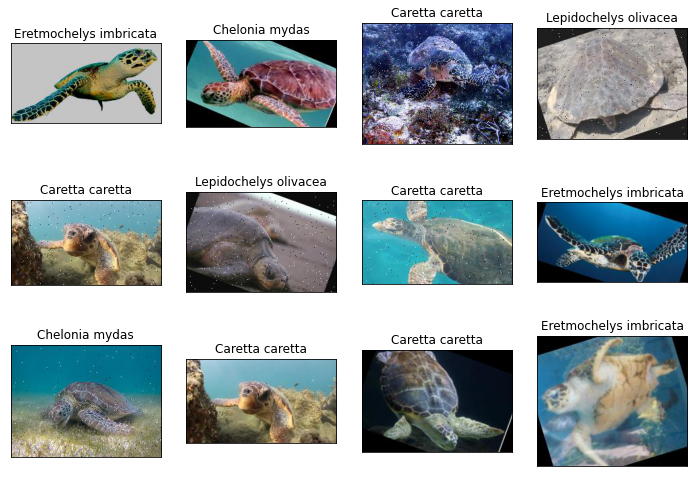

In [29]:
# Display some pictures of the dataset with their labels
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(10, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[i]))
    ax.set_title(image_df.Label[i])
plt.tight_layout()
plt.show()

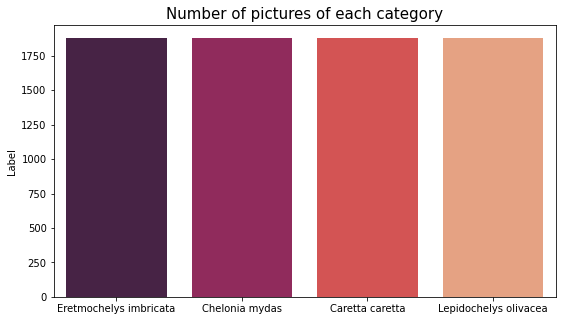

In [30]:
# Display the number of pictures of each category
import seaborn as sns
vc = image_df['Label'].value_counts()
plt.figure(figsize=(9,5))
sns.barplot(x = vc.index, y = vc, palette = "rocket")
plt.title("Number of pictures of each category", fontsize = 15)
plt.show()

In [31]:
# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator()
validasi_datagen = ImageDataGenerator()
test_datagen = ImageDataGenerator()

train_data = train_datagen.flow_from_dataframe(dataframe=latih_df,
                                          x_col='Filepath',
                                          y_col='Label',
                                         seed=0,
                                         target_size=(224,224),
                                         batch_size=16,
                                         shuffle=True,
                                         class_mode = 'categorical',
                                         )
validasi_data = validasi_datagen.flow_from_dataframe(dataframe=validasi_df,
                                          x_col='Filepath',
                                          y_col='Label',
                                         seed=0,
                                         target_size=(224,224),
                                         batch_size=16,
                                         class_mode = 'categorical'
                                         )
uji_data = validasi_datagen.flow_from_dataframe(dataframe=uji_df,
                                          x_col='Filepath',
                                          y_col='Label',
                                         seed=0,
                                         target_size=(224,224),
                                         batch_size=16,
                                         class_mode = 'categorical'
                                         )

Found 6960 validated image filenames belonging to 4 classes.
Found 380 validated image filenames belonging to 4 classes.
Found 180 validated image filenames belonging to 4 classes.


# Model Parameter

In [32]:
batch_size = 16
EPOCHS = 100
WARMUP_EPOCHS = 2
LEARNING_RATE = 0.001
WARMUP_LEARNING_RATE = 1e-3
HEIGHT = 224
WIDTH = 224
CANAL = 3
N_CLASSES = 4
ES_PATIENCE = 5
RLROP_PATIENCE = 3
DECAY_DROP = 0.5

In [33]:
from keras import Model, Input
input_shape = (224,224,3)
model_input = Input(shape=input_shape)

# ** InceptionV3**


In [34]:
# Download the pre-trained weights. No top means it excludes the fully connected layer it uses for classification.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2022-08-08 06:29:55--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.24.128, 172.217.194.128, 142.251.10.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.24.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M  44.4MB/s    in 1.9s    

2022-08-08 06:29:58 (44.4 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [35]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import layers

# Set the weights file you downloaded into a variable
local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

# Initialize the base model.
# Set the input shape and remove the dense layers.
pre_trained_model = InceptionV3(input_shape=input_shape, input_tensor=model_input, include_top=False, weights=None)

# Load the pre-trained weights you downloaded.
pre_trained_model.load_weights(local_weights_file)

# Freeze the weights of the layers.
for layer in pre_trained_model.layers:
  layer.trainable = True

In [36]:
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_188 (Conv2D)            (None, 111, 111, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_188 (Batch  (None, 111, 111, 32  96         ['conv2d_188[0][0]']             
 Normalization)                 )                                                      

In [37]:
# Choose `mixed_7` as the last layer of your base model
last_layer = pre_trained_model.get_layer('mixed10')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 5, 5, 2048)


# Define Model Inceptionv3

In [38]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import Model
IMG_SHAPE = (224, 224, 3)
base_model =tf.keras.applications.InceptionV3(weights='imagenet', 
                                       include_top=False,
                                       input_shape=IMG_SHAPE)
x =tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
x =tf.keras.layers.Dropout(0.15)(x)
x =tf.keras.layers.Dense(256, activation='relu')(x)
x =tf.keras.layers.Dropout(0.15)(x)
final_output =tf.keras.layers.Dense(N_CLASSES, activation='softmax', name='final_output')(x)
model =tf.keras.models.Model(inputs=base_model.inputs,outputs=final_output)


87924736/87910968 [==============================] - 1s 0us/step


In [39]:
for layer in model.layers: 
    layer.trainable = False

for i in range(-5, 0):
    model.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer =tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_282 (Conv2D)            (None, 111, 111, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_282 (Batch  (None, 111, 111, 32  96         ['conv2d_282[0][0]']             
 Normalization)                 )                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


                                                                                                  
 batch_normalization_297 (Batch  (None, 25, 25, 64)  192         ['conv2d_297[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_297 (Activation)    (None, 25, 25, 64)   0           ['batch_normalization_297[0][0]']
                                                                                                  
 conv2d_295 (Conv2D)            (None, 25, 25, 48)   12288       ['mixed0[0][0]']                 
                                                                                                  
 conv2d_298 (Conv2D)            (None, 25, 25, 96)   55296       ['activation_297[0][0]']         
                                                                                                  
 batch_nor

In [41]:
import time

start = time.time()

STEP_SIZE_TRAIN = train_data.n//train_data.batch_size
STEP_SIZE_VALID = validasi_data.n//validasi_data.batch_size

history_warmup_inc = model.fit_generator(generator=train_data,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=validasi_data,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

end = time.time()
print('Waktu Training:', end - start)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  del sys.path[0]


Epoch 1/2
435/435 [==============================] - 4639s 11s/step - loss: 3.3409 - accuracy: 0.2858 - val_loss: 1.3603 - val_accuracy: 0.2772
Epoch 2/2
435/435 [==============================] - 30s 70ms/step - loss: 1.3412 - accuracy: 0.3266 - val_loss: 1.2885 - val_accuracy: 0.4022
Waktu Training: 4683.182237148285


In [42]:
for layer in model.layers:
  layer.trainable = True

es =tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es]
optimizer =tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_282 (Conv2D)            (None, 111, 111, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_282 (Batch  (None, 111, 111, 32  96         ['conv2d_282[0][0]']             
 Normalization)                 )                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


                                                                                                  
 conv2d_297 (Conv2D)            (None, 25, 25, 64)   16384       ['mixed0[0][0]']                 
                                                                                                  
 batch_normalization_297 (Batch  (None, 25, 25, 64)  192         ['conv2d_297[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_297 (Activation)    (None, 25, 25, 64)   0           ['batch_normalization_297[0][0]']
                                                                                                  
 conv2d_295 (Conv2D)            (None, 25, 25, 48)   12288       ['mixed0[0][0]']                 
                                                                                                  
 conv2d_29

In [43]:
history_finetunning_inc = model.fit_generator(generator=train_data,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=validasi_data,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

Epoch 1/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys


435/435 [==============================] - 73s 144ms/step - loss: 1.1243 - accuracy: 0.4876 - val_loss: 1.7838 - val_accuracy: 0.4402
Epoch 2/100
435/435 [==============================] - 60s 139ms/step - loss: 0.9005 - accuracy: 0.6029 - val_loss: 1.5439 - val_accuracy: 0.5652
Epoch 3/100
435/435 [==============================] - 61s 140ms/step - loss: 0.7141 - accuracy: 0.6901 - val_loss: 0.8457 - val_accuracy: 0.6739
Epoch 4/100
435/435 [==============================] - 60s 139ms/step - loss: 0.5791 - accuracy: 0.7626 - val_loss: 1.8979 - val_accuracy: 0.5489
Epoch 5/100
435/435 [==============================] - 61s 140ms/step - loss: 0.4717 - accuracy: 0.8141 - val_loss: 1.0619 - val_accuracy: 0.7038
Epoch 6/100
435/435 [==============================] - 60s 138ms/step - loss: 0.3655 - accuracy: 0.8593 - val_loss: 1.1581 - val_accuracy: 0.6766
Epoch 7/100
435/435 [==============================] - 61s 140ms/step - loss: 0.2981 - accuracy: 0.8914 - val_loss: 2.3052 - val_accurac

# ***VISUALIZE THE RESULTS  Inceptionv3 ***

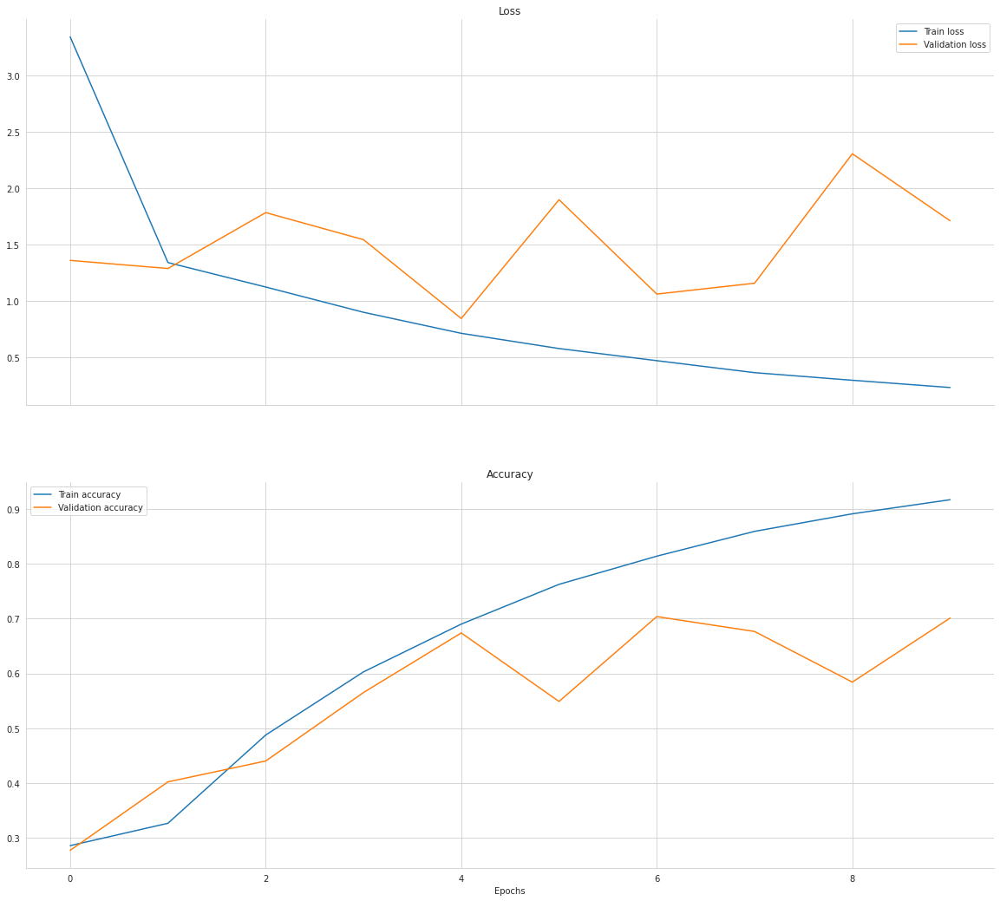

In [44]:
history_inc = {'loss': history_warmup_inc['loss'] + history_finetunning_inc['loss'], 
           'val_loss': history_warmup_inc['val_loss'] + history_finetunning_inc['val_loss'], 
           'acc': history_warmup_inc['accuracy'] + history_finetunning_inc['accuracy'], 
           'val_acc': history_warmup_inc['val_accuracy'] + history_finetunning_inc['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 18))

ax1.plot(history_inc['loss'], label='Train loss')
ax1.plot(history_inc['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history_inc['acc'], label='Train accuracy')
ax2.plot(history_inc['val_acc'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

In [46]:
# Predict the label of the test_images
import numpy as np
pred = model.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Eretmochelys imbricata', 'Lepidochelys olivacea', 'Chelonia mydas']


In [48]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.35      0.18      0.24        45
        Chelonia mydas       0.25      0.31      0.28        45
Eretmochelys imbricata       0.37      0.22      0.28        45
 Lepidochelys olivacea       0.32      0.53      0.40        45

              accuracy                           0.31       180
             macro avg       0.32      0.31      0.30       180
          weighted avg       0.32      0.31      0.30       180



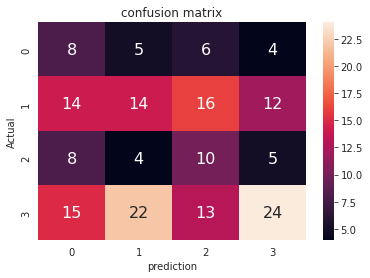

In [49]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

# DenseNet201

In [50]:
IMG_SHAPE = (224, 224, 3)
base_model_dense =tf.keras.applications.DenseNet201(weights='imagenet', 
                                       include_top=False,
                                       input_shape=IMG_SHAPE)
x_densenet =tf.keras.layers.GlobalAveragePooling2D()(base_model_dense.output)
x_densenet =tf.keras.layers.Dropout(0.15)(x_densenet)
x_densenet =tf.keras.layers.Dense(1024, activation='relu')(x_densenet)
x_densenet =tf.keras.layers.Dropout(0.15)(x_densenet)
final_output_dense =tf.keras.layers.Dense(N_CLASSES, activation='softmax', name='final_output_dense')(x_densenet)
model_densenet201 =tf.keras.models.Model(inputs=base_model_dense.inputs,outputs=final_output_dense)

74850304/74836368 [==============================] - 1s 0us/step


In [51]:
for layer in model_densenet201.layers: 
    layer.trainable = False

for i in range(-5, 0):
    model_densenet201.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer =tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model_densenet201.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_densenet201.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_5[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 conv2_block5_0_relu (Activatio  (None, 56, 56, 192)  0          ['conv2_block5_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block5_1_conv (Conv2D)   (None, 56, 56, 128)  24576       ['conv2_block5_0_relu[0][0]']    
                                                                                                  
 conv2_block5_1_bn (BatchNormal  (None, 56, 56, 128)  512        ['conv2_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block5_1_relu (Activatio  (None, 56, 56, 128)  0          ['conv2_block5_1_bn[0][0]']      
 n)                                                                                               
          

In [52]:
import time

start = time.time()

STEP_SIZE_TRAIN = train_data.n//train_data.batch_size
STEP_SIZE_VALID = validasi_data.n//validasi_data.batch_size

history_warmup_den = model_densenet201.fit_generator(generator=train_data,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=validasi_data,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

end = time.time()
print('Waktu Training:', end - start)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  del sys.path[0]


Epoch 1/2
435/435 [==============================] - 59s 98ms/step - loss: 1.7076 - accuracy: 0.4930 - val_loss: 1.1800 - val_accuracy: 0.5000
Epoch 2/2
435/435 [==============================] - 40s 93ms/step - loss: 1.0305 - accuracy: 0.5649 - val_loss: 0.9254 - val_accuracy: 0.6033
Waktu Training: 99.89956212043762


In [53]:
for layer in model_densenet201.layers:
  layer.trainable = True

es =tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es]
optimizer =tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model_densenet201.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_densenet201.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_5[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


                                                                                                  
 conv2_block5_1_bn (BatchNormal  (None, 56, 56, 128)  512        ['conv2_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block5_1_relu (Activatio  (None, 56, 56, 128)  0          ['conv2_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block5_2_conv (Conv2D)   (None, 56, 56, 32)   36864       ['conv2_block5_1_relu[0][0]']    
                                                                                                  
 conv2_block5_concat (Concatena  (None, 56, 56, 224)  0          ['conv2_block4_concat[0][0]',    
 te)      

In [54]:
history_finetunning_den = model_densenet201.fit(train_data,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=validasi_data,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

Epoch 1/100
435/435 [==============================] - 159s 304ms/step - loss: 0.9684 - accuracy: 0.5977 - val_loss: 1.2212 - val_accuracy: 0.5272
Epoch 2/100
435/435 [==============================] - 128s 295ms/step - loss: 0.6799 - accuracy: 0.7451 - val_loss: 1.1909 - val_accuracy: 0.7201
Epoch 3/100
435/435 [==============================] - 128s 294ms/step - loss: 0.5043 - accuracy: 0.8126 - val_loss: 3.5156 - val_accuracy: 0.5163
Epoch 4/100
435/435 [==============================] - 128s 294ms/step - loss: 0.3856 - accuracy: 0.8694 - val_loss: 1.1941 - val_accuracy: 0.7473
Epoch 5/100
435/435 [==============================] - 128s 294ms/step - loss: 0.2774 - accuracy: 0.9023 - val_loss: 3.1643 - val_accuracy: 0.5462
Epoch 6/100
435/435 [==============================] - 128s 294ms/step - loss: 0.2613 - accuracy: 0.9066 - val_loss: 2.2027 - val_accuracy: 0.5163
Epoch 7/100
435/435 [==============================] - 128s 294ms/step - loss: 0.1930 - accuracy: 0.9342 - val_loss: 1

# ***VISUALIZE THE RESULTS DenseNet201***

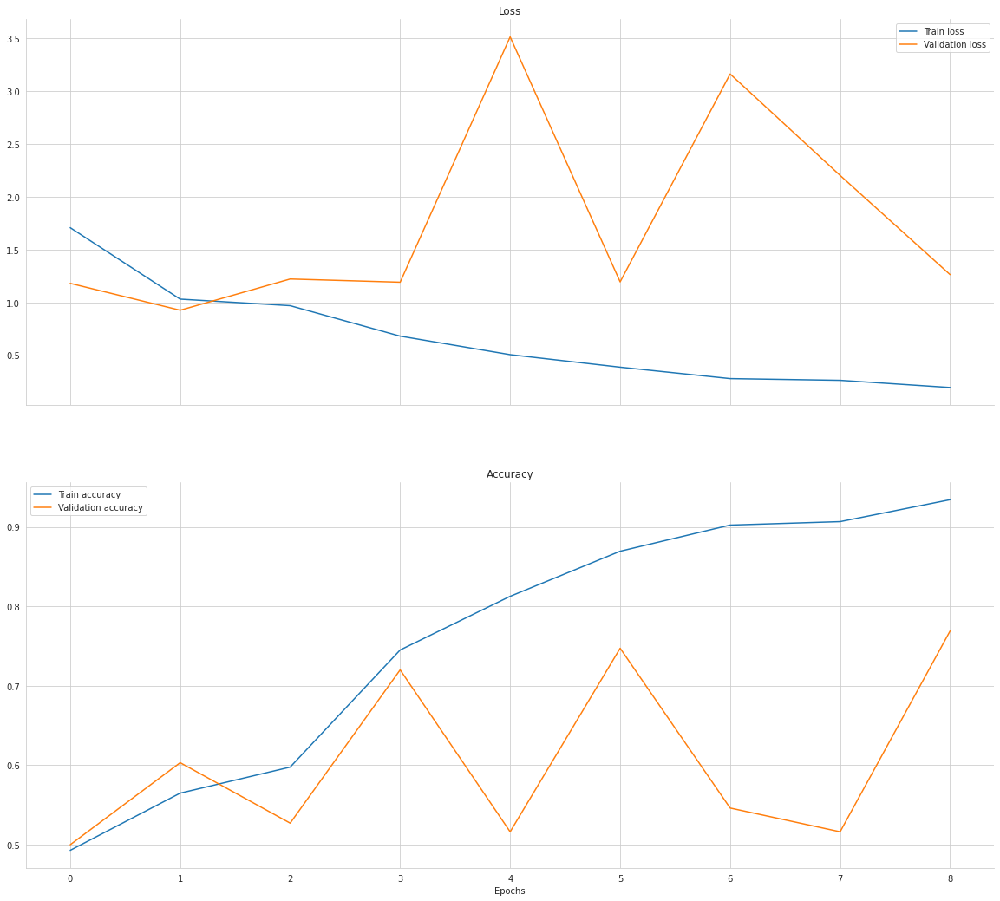

In [55]:
history_den = {'loss': history_warmup_den['loss'] + history_finetunning_den['loss'], 
           'val_loss': history_warmup_den['val_loss'] + history_finetunning_den['val_loss'], 
           'acc': history_warmup_den['accuracy'] + history_finetunning_den['accuracy'], 
           'val_acc': history_warmup_den['val_accuracy'] + history_finetunning_den['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 18))

ax1.plot(history_den['loss'], label='Train loss')
ax1.plot(history_den['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history_den['acc'], label='Train accuracy')
ax2.plot(history_den['val_acc'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

In [57]:
# Predict the label of the test_images
import numpy as np
pred = model_densenet201.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Chelonia mydas', 'Caretta caretta', 'Caretta caretta', 'Caretta caretta']


In [58]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.18      0.27      0.22        45
        Chelonia mydas       0.23      0.29      0.25        45
Eretmochelys imbricata       0.24      0.11      0.15        45
 Lepidochelys olivacea       0.24      0.20      0.22        45

              accuracy                           0.22       180
             macro avg       0.22      0.22      0.21       180
          weighted avg       0.22      0.22      0.21       180



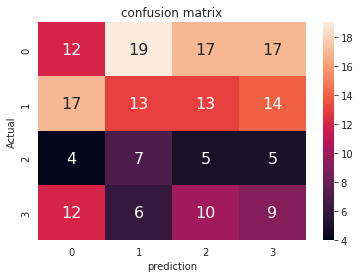

In [59]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

# `Rednet50


In [60]:
IMG_SHAPE = (224, 224, 3)
from tensorflow.keras.applications import resnet50
base_model_resnet50 =resnet50.ResNet50(weights='imagenet', 
                                       include_top=False,
                                       input_shape=IMG_SHAPE)
x_resnet50 =tf.keras.layers.GlobalAveragePooling2D()(base_model_resnet50.output)
x_resnet50 =tf.keras.layers.Dropout(0.15)(x_resnet50)
x_resnet50 =tf.keras.layers.Dense(256, activation='relu')(x_resnet50)
x_resnet50 =tf.keras.layers.Dropout(0.15)(x_resnet50)
final_output_resnet50 =tf.keras.layers.Dense(N_CLASSES, activation='softmax', name='final_output_resnet50')(x_resnet50)
model_resnet50 =tf.keras.models.Model(inputs=base_model_resnet50.inputs,outputs=final_output_resnet50)

94781440/94765736 [==============================] - 1s 0us/step


In [61]:
for layer in model_resnet50.layers: 
    layer.trainable = False

for i in range(-5, 0):
    model_resnet50.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer =tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model_resnet50.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_resnet50.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


                                                                                                  
 conv2_block3_out (Activation)  (None, 56, 56, 256)  0           ['conv2_block3_add[0][0]']       
                                                                                                  
 conv3_block1_1_conv (Conv2D)   (None, 28, 28, 128)  32896       ['conv2_block3_out[0][0]']       
                                                                                                  
 conv3_block1_1_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block1_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block1_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block1_1_bn[0][0]']      
 n)                                                                                               
          

In [62]:
import time

start = time.time()

STEP_SIZE_TRAIN = train_data.n//train_data.batch_size
STEP_SIZE_VALID = validasi_data.n//validasi_data.batch_size

history_warmup_r50 = model_resnet50.fit(train_data,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=validasi_data,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

end = time.time()
print('Waktu Training:', end - start)

Epoch 1/2
435/435 [==============================] - 38s 77ms/step - loss: 0.8406 - accuracy: 0.6723 - val_loss: 0.8310 - val_accuracy: 0.6603
Epoch 2/2
435/435 [==============================] - 31s 72ms/step - loss: 0.5188 - accuracy: 0.7981 - val_loss: 0.7496 - val_accuracy: 0.7255
Waktu Training: 79.41649675369263


In [63]:
for layer in model_resnet50.layers:
  layer.trainable = True

es =tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es]
optimizer =tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model_resnet50.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_resnet50.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_6[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 n)                                                                                               
                                                                                                  
 conv3_block1_0_conv (Conv2D)   (None, 28, 28, 512)  131584      ['conv2_block3_out[0][0]']       
                                                                                                  
 conv3_block1_3_conv (Conv2D)   (None, 28, 28, 512)  66048       ['conv3_block1_2_relu[0][0]']    
                                                                                                  
 conv3_block1_0_bn (BatchNormal  (None, 28, 28, 512)  2048       ['conv3_block1_0_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block1_3_bn (BatchNormal  (None, 28, 28, 512)  2048       ['conv3_block1_3_conv[0][0]']    
 ization) 

In [64]:
history_finetunning_r50 = model_resnet50.fit(train_data,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=validasi_data,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

Epoch 1/100
435/435 [==============================] - 90s 189ms/step - loss: 1.1450 - accuracy: 0.4925 - val_loss: 2.0142 - val_accuracy: 0.3804
Epoch 2/100
435/435 [==============================] - 81s 187ms/step - loss: 0.9140 - accuracy: 0.6043 - val_loss: 1.2919 - val_accuracy: 0.5489
Epoch 3/100
435/435 [==============================] - 81s 187ms/step - loss: 0.7580 - accuracy: 0.6835 - val_loss: 2.4900 - val_accuracy: 0.4076
Epoch 4/100
435/435 [==============================] - 81s 187ms/step - loss: 0.6256 - accuracy: 0.7583 - val_loss: 1.5125 - val_accuracy: 0.5380
Epoch 5/100
435/435 [==============================] - 81s 186ms/step - loss: 0.4623 - accuracy: 0.8303 - val_loss: 2.5011 - val_accuracy: 0.6168
Epoch 6/100
435/435 [==============================] - 81s 187ms/step - loss: 0.3474 - accuracy: 0.8724 - val_loss: 2.2962 - val_accuracy: 0.5652
Epoch 7/100
435/435 [==============================] - 81s 186ms/step - loss: 0.2670 - accuracy: 0.9080 - val_loss: 1.4431 -

# ***VISUALIZE THE RESULTS Ensemble Resnet50***

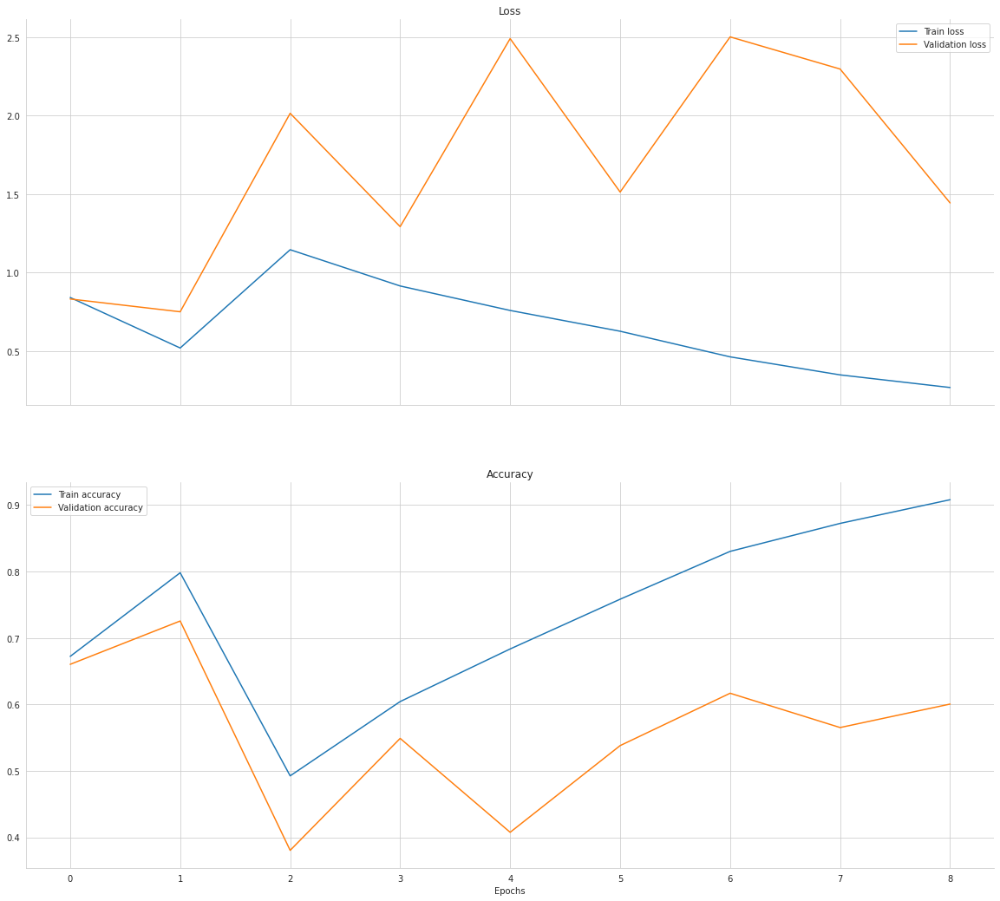

In [65]:
history_res = {'loss': history_warmup_r50['loss'] + history_finetunning_r50['loss'], 
           'val_loss': history_warmup_r50['val_loss'] + history_finetunning_r50['val_loss'], 
           'acc': history_warmup_r50['accuracy'] + history_finetunning_r50['accuracy'], 
           'val_acc': history_warmup_r50['val_accuracy'] + history_finetunning_r50['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 18))

ax1.plot(history_res['loss'], label='Train loss')
ax1.plot(history_res['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history_res['acc'], label='Train accuracy')
ax2.plot(history_res['val_acc'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

In [66]:
# Predict the label of the test_images
import numpy as np
pred = model_resnet50.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Lepidochelys olivacea', 'Lepidochelys olivacea', 'Eretmochelys imbricata', 'Eretmochelys imbricata']


In [67]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.42      0.18      0.25        45
        Chelonia mydas       0.00      0.00      0.00        45
Eretmochelys imbricata       0.24      0.47      0.32        45
 Lepidochelys olivacea       0.33      0.51      0.40        45

              accuracy                           0.29       180
             macro avg       0.25      0.29      0.24       180
          weighted avg       0.25      0.29      0.24       180



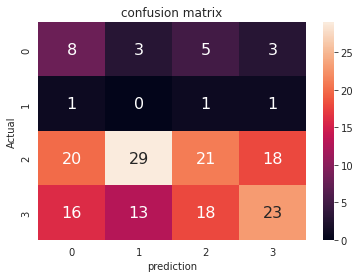

In [68]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

# Ensemble Inception & resnet50


In [69]:
models = [model, model_resnet50]
model_outputs = [model(model_input) for model in models]
ensemble_output = tf.keras.layers.Average()(model_outputs)
ensemble_model = tf.keras.Model(inputs=model_input, outputs=ensemble_output)

In [70]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [71]:
ensemble_model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# Ensemble Inception & desnet201





In [72]:
models = [model, model_densenet201]
model_outputs_ID = [model(model_input) for model in models]
ensemble_output_ID = tf.keras.layers.Average()(model_outputs_ID)
ensemble_model_ID = tf.keras.Model(inputs=model_input, outputs=ensemble_output_ID)

In [73]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [74]:
ensemble_model_ID.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# Ensemble Resnet50 & desnet201





In [75]:
models = [model, model_densenet201]
model_outputs_DR = [model(model_input) for model in models]
ensemble_output_DR = tf.keras.layers.Average()(model_outputs_DR)
ensemble_model_DR = tf.keras.Model(inputs=model_input, outputs=ensemble_output_DR)

In [76]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [77]:
ensemble_model_DR.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# Ensemble InceptionV3, Resnet50 & DenseNet201





In [78]:
models = [model, model_densenet201, model_resnet50]
model_outputs_DRI = [model(model_input) for model in models]
ensemble_output_DRI = tf.keras.layers.Average()(model_outputs_DRI)
ensemble_model_DRI = tf.keras.Model(inputs=model_input, outputs=ensemble_output_DRI)

In [79]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [80]:
ensemble_model_DRI.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# ***VISUALIZE THE RESULTS Ensemble Inceptionv3 & Resnet50***

In [82]:
metrics_train = ensemble_model.evaluate(train_data)
metrics_test = ensemble_model.evaluate(uji_data)

12/12 [==============================] - 1s 93ms/step - loss: 0.8826 - accuracy: 0.5611


In [83]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.7717803716659546, 0.6714080572128296]
--------------------------------------------
TEST_SET: [0.8825739622116089, 0.5611110925674438]


In [84]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Lepidochelys olivacea', 'Chelonia mydas', 'Lepidochelys olivacea', 'Eretmochelys imbricata']


In [85]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.31      0.11      0.16        45
        Chelonia mydas       0.24      0.20      0.22        45
Eretmochelys imbricata       0.36      0.36      0.36        45
 Lepidochelys olivacea       0.30      0.56      0.39        45

              accuracy                           0.31       180
             macro avg       0.30      0.31      0.28       180
          weighted avg       0.30      0.31      0.28       180



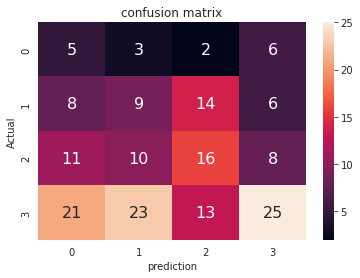

In [86]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

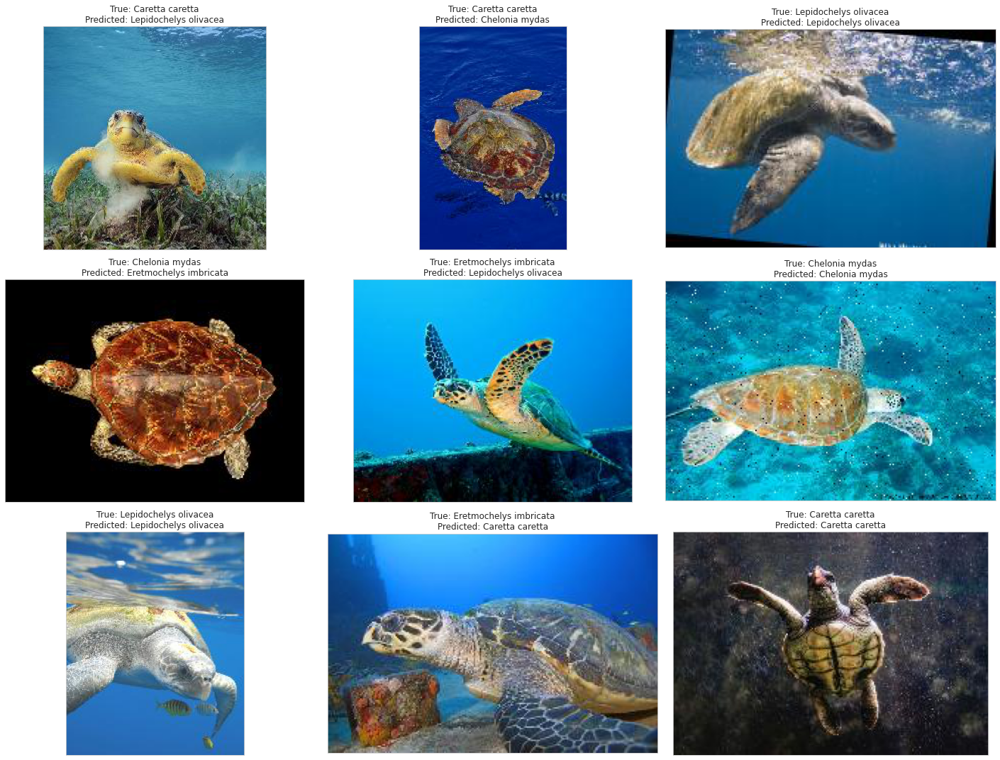

In [88]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(uji_df.Filepath.iloc[i]))
    ax.set_title(f"True: {uji_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# ***VISUALIZE THE RESULTS Ensemble Inceptionv3 & DenseNet201***

In [89]:
metrics_train = ensemble_model_ID.evaluate(train_data)
metrics_test = ensemble_model_ID.evaluate(uji_data)

12/12 [==============================] - 2s 120ms/step - loss: 0.6900 - accuracy: 0.7278


In [90]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.581226646900177, 0.7443965673446655]
--------------------------------------------
TEST_SET: [0.6900274157524109, 0.7277777791023254]


In [91]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model_ID.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Chelonia mydas', 'Caretta caretta', 'Lepidochelys olivacea']


In [92]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.19      0.24      0.21        45
        Chelonia mydas       0.23      0.24      0.24        45
Eretmochelys imbricata       0.11      0.07      0.08        45
 Lepidochelys olivacea       0.13      0.13      0.13        45

              accuracy                           0.17       180
             macro avg       0.16      0.17      0.17       180
          weighted avg       0.16      0.17      0.17       180



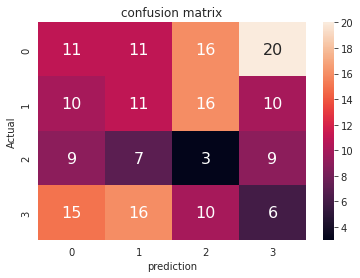

In [93]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

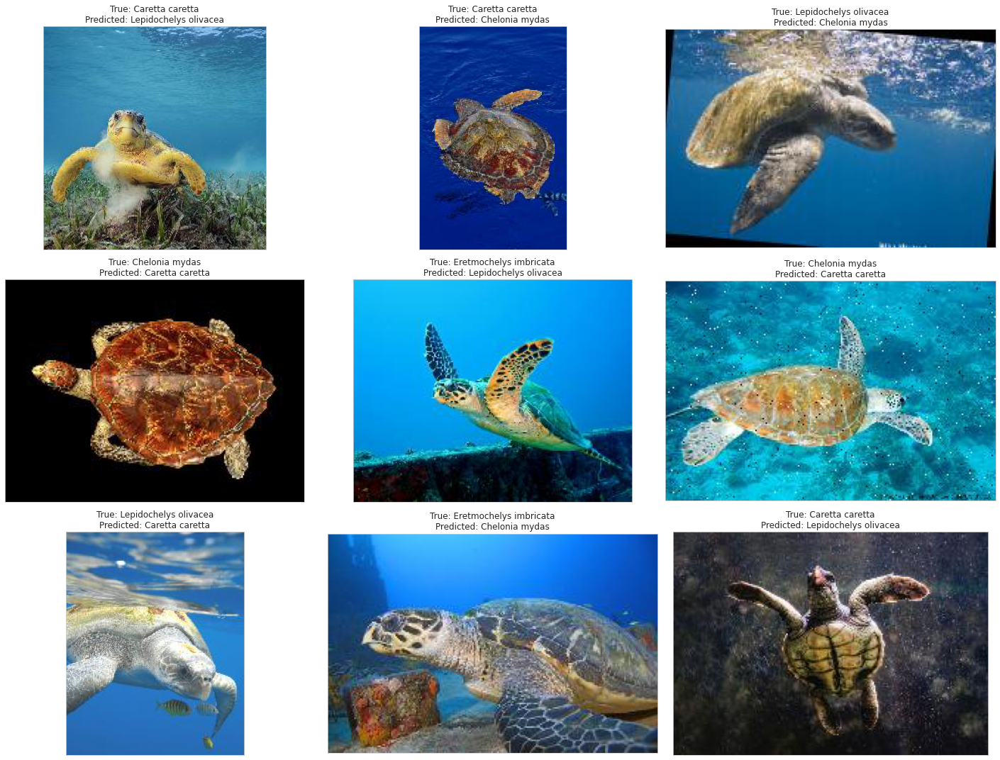

In [103]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(uji_df.Filepath.iloc[i]))
    ax.set_title(f"True: {uji_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# ***VISUALIZE THE RESULTS Ensemble Resnet50 & DenseNet201***

In [104]:
metrics_train = ensemble_model_DR.evaluate(train_data)
metrics_test = ensemble_model_DR.evaluate(uji_data)

12/12 [==============================] - 2s 118ms/step - loss: 0.6900 - accuracy: 0.7278


In [105]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.5812268257141113, 0.7443965673446655]
--------------------------------------------
TEST_SET: [0.6900274753570557, 0.7277777791023254]


In [106]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model_DR.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Chelonia mydas', 'Chelonia mydas', 'Chelonia mydas']


In [107]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.28      0.36      0.31        45
        Chelonia mydas       0.26      0.27      0.26        45
Eretmochelys imbricata       0.36      0.22      0.27        45
 Lepidochelys olivacea       0.23      0.24      0.24        45

              accuracy                           0.27       180
             macro avg       0.28      0.27      0.27       180
          weighted avg       0.28      0.27      0.27       180



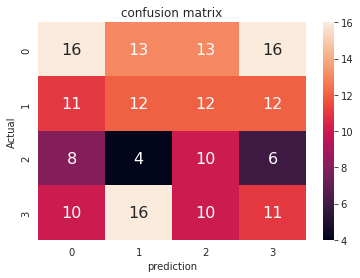

In [108]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

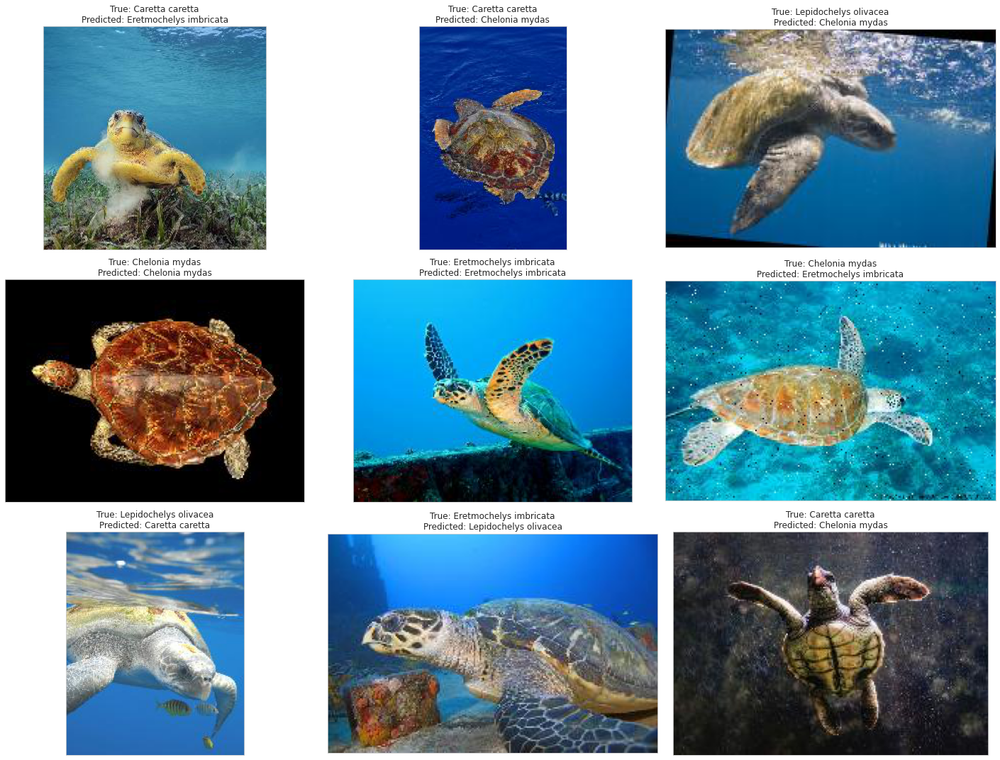

In [109]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(uji_df.Filepath.iloc[i]))
    ax.set_title(f"True: {uji_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# ***VISUALIZE THE RESULTS Ensemble Inceptionv3, Resnet50 & DenseNet201***

In [110]:
metrics_train = ensemble_model_DRI.evaluate(train_data)
metrics_test = ensemble_model_DRI.evaluate(uji_data)

12/12 [==============================] - 2s 170ms/step - loss: 0.7093 - accuracy: 0.7667


In [111]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.6515965461730957, 0.7521551847457886]
--------------------------------------------
TEST_SET: [0.7092552781105042, 0.7666666507720947]


In [112]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model_DRI.predict(uji_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Lepidochelys olivacea', 'Caretta caretta', 'Eretmochelys imbricata']


In [113]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(uji_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.32      0.33      0.33        45
        Chelonia mydas       0.18      0.20      0.19        45
Eretmochelys imbricata       0.24      0.18      0.21        45
 Lepidochelys olivacea       0.16      0.18      0.17        45

              accuracy                           0.22       180
             macro avg       0.23      0.22      0.22       180
          weighted avg       0.23      0.22      0.22       180



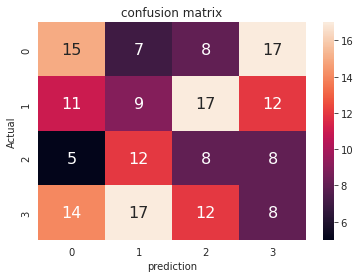

In [114]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

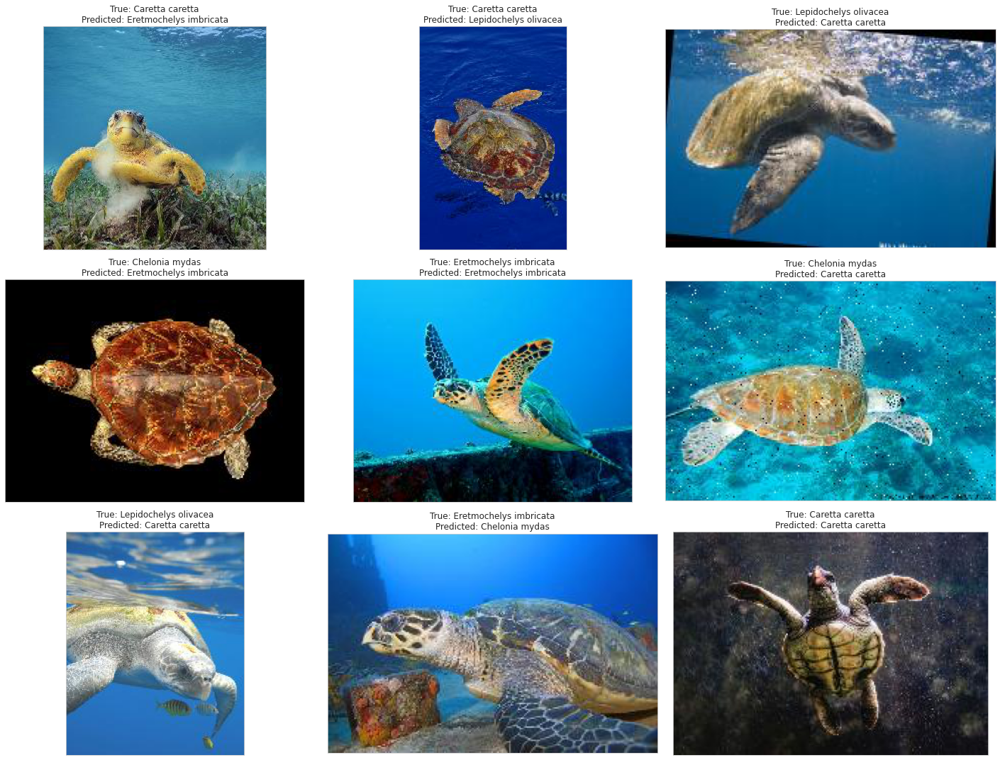

In [115]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(uji_df.Filepath.iloc[i]))
    ax.set_title(f"True: {uji_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()